# MTH3302 - Méthodes probabilistes et statistiques pour I.A.
#### Polytechnique Montréal


### Projet A2022

-----

# Récolte des cerfs de Virginie

### Contexte

Le cerf de Virginie, couramment appelé chevreuil au Québec, est un cervidé originaire d'Amérique dont l’aire de répartition dans l’est de l’Amérique trouve sa limite nordique au Québec. Sous nos latitudes, un des facteurs qui influence la survie de cet animal est la rigueur de l’hiver. Des hivers rigoureux peuvent faire décliner rapidement les populations alors qu’à l’inverse quelques hivers cléments peuvent entrainer un fort accroissement.

### Objectif

Nous nous concentrons ici uniquement sur les mâles adultes récoltés dans chaque zone de chasse. L'objectif est de prédire, pour différentes zone de chasses, **le nombre de mâles récoltés pour l'année 2021**.

### Données
Les données utilisées pour inférer le nombre de cerfs récoltés pour l'année 2021 sont les suivantes :
 - `recolte.csv` : Statistiques de chasse au cerf de Viriginie
 - `permis.csv` : Nombre de permis de chasse au cerf de Virginie vendus
 - `essence.csv` : Prix de détail moyens mensuel de l'essence
 - `meteo.csv` : Données météorologiques quotidiennes pour Montréal-Trudeau


## Chargement des données

Importation des librairies utilisées dans le calepin.

In [160]:
using CSV, DataFrames, Statistics, Dates, Gadfly, Combinatorics, Plots

#### Données de récoltes

In [161]:
recolte = CSV.read("data/recolte.csv", DataFrame)
first(recolte, 5)

Row,Année,Zone,Engin,Cerfs
,Int64,Int64,String15,Int64
1,1999,2,Arc,58
2,1999,2,Carabine,852
3,1999,2,Indéterminé,12
4,1999,3,Arc,94
5,1999,3,Carabine,1422


#### Données météo

In [162]:
meteo = CSV.read("data/meteo.csv", DataFrame)
rename!(meteo, :"Date/Time"         => :"date",
               :"Mean Temp (°C)"    => :"mean_temp_C",
               :"Total Rain (mm)"   => :"total_rain_mm",
               :"Total Snow (cm)"   => :"total_snow_cm",
               :"Snow on Grnd (cm)" => :"snow_on_grnd_cm")
first(meteo, 5)

Row,date,mean_temp_C,total_rain_mm,total_snow_cm,snow_on_grnd_cm
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2
2,1999-01-02,-19.2,0.0,0.0,2
3,1999-01-03,-8.5,1.2,11.4,7
4,1999-01-04,-9.4,0.0,0.0,8
5,1999-01-05,-14.3,0.0,0.0,8


#### Données sur les permis

In [163]:
permis = CSV.read("data/permis.csv", DataFrame)
first(permis, 5)

Row,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,missing,1230,136639
2,1999,131325,missing,1260,132585
3,2000,137346,missing,1463,138809
4,2001,144074,missing,1551,145625
5,2002,151154,missing,1735,152889


#### Données sur l'essence

In [164]:
essence = CSV.read("data/essence.csv", DataFrame)
first(essence, 5)

Row,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3
2,1997-05-01,60.7,60.5
3,1997-06-01,59.4,61.5
4,1997-07-01,57.9,59.7
5,1997-08-01,62.8,64.0


## Exploration des données

Commençons par nous familiariser avec les données pour mieux comprendre si elles sont utiles et si oui, en quoi elles peuvent nous aider. Pour cette étape, nous n'avons pas de stratégie particulière : nous avons utilisé notre intuition et les connaissances que nous possédions sur la pratique de la chasse.

### Données de récoltes

#### Tendance générale

On peut commencer par afficher le nombre total de cerfs tués chaque année. Les données de récolte sont groupées par zone et par engin : chaque année, on a le nombre de cerfs tués pour chacune des zones et pour chaque engin. Ici, on va grouper toutes les zones entre elles et tous les engins entre eux :

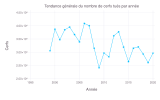

In [165]:
set_default_plot_size(16cm, 10cm)
df = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
general_tendance = Gadfly.plot(df, x=:Année, y=:Cerfs, Geom.line, Geom.point, Guide.title("Tendance générale du nombre de cerfs tués par année"))

Sur le graphe ci-dessus, on peut remarquer une lègère tendance descendante du nombre de cerfs récoltés par année. Cela est cohérent avec la pratique de la chasse en général, qui est en baisse. De plus, l'année 2009 semble particulière avec le plus faible nombre de cerfs récoltés depuis 20 ans.


On semble deviner cette tendance générale en baisse pour toutes les zones. Allons plus loin et affichons les récoltes de cerfs groupées par zone et groupées par engin.

#### Zones individuelles

On peut afficher la même information mais pour chaque zone distinctement :

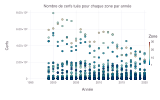

In [166]:
Gadfly.plot(recolte, x=:Année, y=:Cerfs, color=:Zone, Geom.point, Guide.title("Nombre de cerfs tués pour chaque zone par année"))

Les cellules ci-dessous affichent le nombre de cerfs récoltés chaque année pour chacune des zones. Le but ici est de remarquer s'il existe des zones particulières.

In [167]:
df_by_zone = DataFrame(Année = Int64[], Zone = Int64[], Cerfs= Int64[])
max_n_cerfs = -Inf
for zone in groupby(recolte, :Zone)
    df = combine(groupby(zone, :Année), :Cerfs => sum => :Cerfs)  
    max_n_cerfs_i = maximum(df.Cerfs)
    if max_n_cerfs_i > max_n_cerfs
        max_n_cerfs = max_n_cerfs_i
    end
    df2 = DataFrame(Année = df.Année, 
                    Zone = fill(unique(zone.Zone)[1], size(df, 1)),
                    Cerfs = df.Cerfs) 

    append!(df_by_zone, df2)
end
println("Le nombre maximal de cerfs tué toutes zones confondues : $max_n_cerfs")

Le nombre maximal de cerfs tué toutes zones confondues : 8204


On peut maintenant afficher le nombre de cerfs récoltés pour chaque zone. On prête bien attention à utiliser les mêmes échelles en `x` et en `y` afin d'être en mesure de pouvoir comparer les zones entre elles correctement :

In [168]:
zones = unique(df_by_zone[!, :Zone])
pp = Plot[]
set_default_plot_size(16cm, 10cm)
push!(pp, general_tendance)

for i = 1:length(zones)
    p = Gadfly.plot(groupby(df_by_zone, :Zone)[i],
                x=:Année,
                y=:Cerfs,
                Geom.point,
                Geom.line,
                Guide.title("Zone $(groupby(df_by_zone, :Zone)[i].Zone[1])"),
                Guide.yticks(ticks=0:1000:max_n_cerfs),
                Guide.xticks(ticks=1999:5:2020))
    push!(pp, p)
end

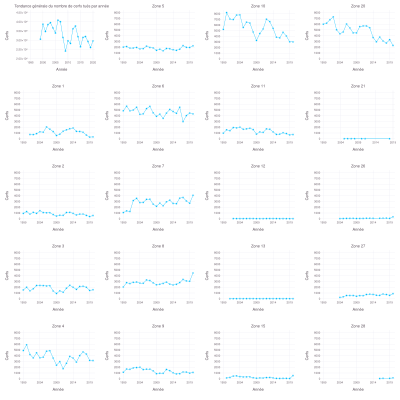

In [169]:
p = reshape(pp, (5,4))

set_default_plot_size(40cm, 40cm)
gridstack(p)

Grâce à ce graphe, on peut remarquer plusieurs choses. Premièrement, **les cerfs sont répartis de manière très hétérogènes** à travers les zones. Certaines zones comme les zones 4, 10 et 20 comptent chaque année des milliers de cerfs récoltés, alors que des zones comme la 28 ne comptent que quelques cerfs (< 10). Selon nous, il y a deux possibilités : les cerfs sont soit présents en faible quantité dans ces zones là, ou bien les chasseurs sont présents en faible quantité dans ces zones là. Comme les données sur les permis ne sont par réparties par zone, il est difficile de répondre à cette question.
Deuxièmement, il y a des données manquantes pour beaucoup de zones : **il manque les récoltes pour certaines années** dans les zones 12, 21, 27, 28 (sans compter les zones où il manque l'année 1999).

#### Engins individuels

On peut effectuer le même raisonnement en regroupant les récoltes de cerfs par engin. Attention, ici **l'échelle `y` est laissée automatique**, dans le but de pouvoir comparer les proportions d'engins utilisés dans les différentes zones. Le code couleur correspondant à chaque outil est également affiché uniquement pour la zone 1 pour éviter de surcharger le graphe.

In [170]:
zones = unique(df_by_zone[!, :Zone])
pp = Plot[]
set_default_plot_size(16cm, 10cm)
push!(pp, general_tendance)
for i = 1:length(zones)
    zone_number = groupby(df_by_zone, :Zone)[i].Zone[1]
    df = filter(row -> row.Zone == zone_number, recolte)
    theme = Theme(key_position = :none)
    if i == 1
        theme = Theme(key_position = :left)
    end
    p = Gadfly.plot(df,
            x=:Année,
            y=:Cerfs,
            color=:Engin,
            Geom.line,
            Geom.point,
            Guide.title("Zone $zone_number"),
            Guide.xticks(ticks=1999:5:2020),
            theme)
    push!(pp, p)
end

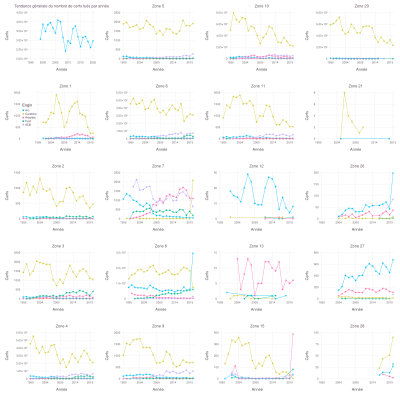

In [171]:
p = reshape(pp, (5,4))

set_default_plot_size(40cm, 40cm)
gridstack(p)

De ces graphes, nous pouvons déduire visuellement que l'engin le plus largement utilisé est la carabine. Cependant, on voit que des zones semblent forcer l'utilisation d'autres engins (ou plutôt, interdire l'utilisation de la carabine), comme les zones 12, 13, 26 et 27. Il pourrait être utile d'incorporer ces informations dans notre modèle.

Il est intéressant de remarquer la zone 8 qui semble avoir interdit l'utilisation de la carabine à partir de 2019, sans pour autant diminuer le nombre total de cerfs récoltés l'année suivante (2020), d'après le graphe de la section précédente.

### Données de météo

Pour les données météo, nous avons exploré plusieurs pistes. Dans un premier temps, nous nous sommes dit que le nombre de cerfs récoltés serait plus faible après un hiver rude, puisque cela défavoriserait leur reproduction. Ainsi, nous avons cherché à afficher le nombre de cerfs récolté en fonction de la température moyenne, et de la hauteur moyenne de neige de l'hiver.

Nous nous sommes vite rendus compte que de regarder l'hiver n'était pas très indicatif en faisant quelques soumissions et à l'aide de notre ensemble de validation sur l'année 2020, nous avons déterminé qu'utiliser les données météo durant la saison de la chasse (à savoir les mois de septembre, octobre, et novembre) était plus favorable. Nous avons donc isolé les mois de la chasse du reste des données de météo, et avons gardé la moyenne annuelle des températures, et des chutes de neiges et de pluie totale dans les cellules suivantes.

In [172]:
is_hunting_season(d::Date) = Dates.month(d) > 8 && Dates.month(d) < 12

is_hunting_season (generic function with 1 method)

In [173]:
# only keep the hunting season months
df_tmp = filter!(:date => is_hunting_season, meteo)
df_tmp = select!(df_tmp, :date, :mean_temp_C, :total_snow_cm, :total_rain_mm)
dropmissing!(df_tmp)

# group by year
df_tmp[!, :date] = Dates.year.(meteo[!, :date])
mean_stats_per_year = combine(groupby(df_tmp, :date, skipmissing=true),
    :mean_temp_C => mean => :mean_temp_C,
    :total_snow_cm => mean => :total_snow_cm,
    :total_rain_mm => mean => :total_rain_mm,
    )
first(mean_stats_per_year, 22)

Row,date,mean_temp_C,total_snow_cm,total_rain_mm
,Int64,Float64,Float64,Float64
1,1999,10.23,0.0566667,3.71333
2,2000,8.54111,0.106667,1.61
3,2001,10.6319,0.0505495,2.44945
4,2002,8.67692,0.695604,1.90549
5,2003,9.49341,0.0307692,4.3011
6,2004,9.17363,0.0043956,2.13626
7,2005,10.1286,0.149451,4.31648
8,2006,9.11319,0.0,3.47473
9,2007,9.71099,0.318681,2.30549


In [174]:
df_meteo_annee = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
p = select(mean_stats_per_year, :date, :mean_temp_C, :total_snow_cm, :total_rain_mm)
allowmissing!(p)
insert!.(eachcol(p), 15, [2013, missing, missing, missing])
df_meteo_annee[!, :mean_hunting_temp] = p.mean_temp_C[1:22]
df_meteo_annee[!, :total_snow_cm] = p.total_snow_cm[1:22]
df_meteo_annee[!, :total_rain_mm] = p.total_rain_mm[1:22]
first(df_meteo_annee, 22)

Row,Année,Cerfs,mean_hunting_temp,total_snow_cm,total_rain_mm
,Int64,Int64,Float64?,Float64?,Float64?
1,1999,30587,10.23,0.0566667,3.71333
2,2000,38737,8.54111,0.106667,1.61
3,2001,34751,10.6319,0.0505495,2.44945
4,2002,38501,8.67692,0.695604,1.90549
5,2003,39544,9.49341,0.0307692,4.3011
6,2004,36699,9.17363,0.0043956,2.13626
7,2005,33913,10.1286,0.149451,4.31648
8,2006,40908,9.11319,0.0,3.47473
9,2007,40047,9.71099,0.318681,2.30549


Nous possédons les données météo de l'année 2021, ce qui est un avantage. En revanche, un des défauts de notre méthode est que nous considérons que la météo est la même sur l'ensemble des zones. Un modèle qui pondère le poids des données météo en fonction de la distance de la zone à Montréal serait une approche pour pallier à cela. Par manque de temps, nous n'avons pas appliqué cette méthode.

L'idée de cette approche est de tracer le nombre de cerfs récoltés selon les conditions météos. Nous sommes partis du postulat que les chasseurs récolteraient moins de cerfs lorsque les conditions météo sont mauvaises.

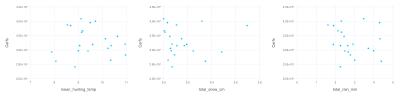

In [175]:
pp = [
    Gadfly.plot(df_meteo_annee, x=:mean_hunting_temp, y=:Cerfs, Geom.point),
    Gadfly.plot(df_meteo_annee, x=:total_snow_cm,    y=:Cerfs, Geom.point),
    Gadfly.plot(df_meteo_annee, x=:total_rain_mm,    y=:Cerfs, Geom.point)
]

p = reshape(pp, (1,3))

set_default_plot_size(40cm, 10cm)
gridstack(p)

En observant ces données à l'oeil, il ne semble pas y avoir de relation entre la température des mois d'hiver et le nombre de cerfs récoltés. En revanche, nous semblons déceler une corrélation négative entre le nombre de cerfs tués et la quantité de pluie et de neige tombée. Cela semble à priori plutôt logique : les chasseurs seront moins nombreux si les conditions météo ne sont pas propices. Nous allons tout de même regarder ces données de plus près : 

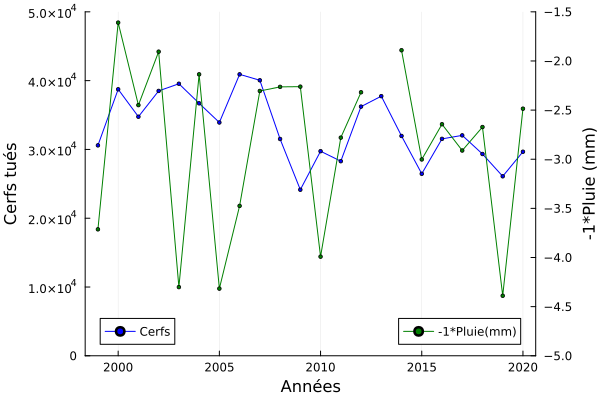

In [176]:
df_meteo_annee.opp_pluie = -df_meteo_annee.total_rain_mm
Plots.plot()
Plots.plot!(df_meteo_annee.:Année, df_meteo_annee.:Cerfs,
            xlabel="Années", ylabel="Cerfs tués", 
            c=:blue, marker = 2, ylim = (0, 50000),
            label = "Cerfs", leg=:bottomleft)

Plots.plot!(twinx(), df_meteo_annee.:Année, df_meteo_annee.:opp_pluie,
    ylabel="-1*Pluie (mm)",
    c=:green,
    marker = 2,
    ylim = (-5, -1.5),
    label="-1*Pluie(mm)",
    leg=:bottomright
    )


Ce graphique permet de vérifier qu'il semble y avoir une certaine corrélation négative entre la pluie tombée pendant la période de chasse et le nombre de cerfs tués. Cette corrélation semble particulièrement forte ces dernières années.

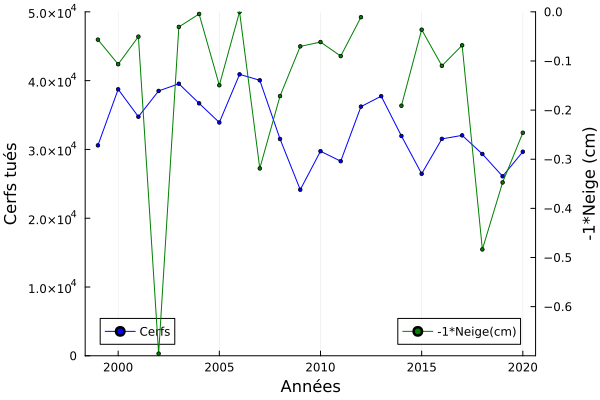

In [177]:
df_meteo_annee.opp_neige = -df_meteo_annee.total_snow_cm
Plots.plot()
Plots.plot!(df_meteo_annee.:Année, df_meteo_annee.:Cerfs,
            xlabel="Années", ylabel="Cerfs tués", 
            c=:blue, marker = 2, ylim = (0, 50000),
            label = "Cerfs", leg=:bottomleft)

Plots.plot!(twinx(), df_meteo_annee.:Année, df_meteo_annee.:opp_neige,
    ylabel="-1*Neige (cm)",
    c=:green,
    marker = 2,
    ylim = (-0.7, 0),
    label = "-1*Neige(cm)", 
    leg=:bottomright
    )

La corrélation semble moins évidente ici que dans le cas de la pluie.

Il est à noter également que toutes ces données météo étant celles de Montréal, leur influence sur les zones proches de la ville est sûrement plus grande que sur les zones éloignées.
Nous faisons le choix pour la suite de tout de même inclure toutes ces données météo dans notre modèle, pour qu'au moins les zones proches de Montréal (qui sont nombreuses) puissent en bénéficier, du moment qu'aucune colinéarité n'est introduite.

### Données de permis

De la même manière, on peut comparer le nombre de cerfs récoltés avec le nombre de permis récoltés par année.

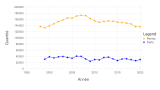

In [178]:
set_default_plot_size(16cm, 9cm)
df_permis = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
Gadfly.plot(
    layer(permis, x=:Année, y=:Total, Geom.line, Geom.point, Theme(default_color="orange")),
    layer(df_permis, x=:Année, y=:Cerfs, Geom.line, Geom.point, Theme(default_color="blue")),
    Guide.ylabel("Quantité"),
    Guide.yticks(ticks=0:20000:200000),
    Guide.manual_color_key("Legend", ["Permis", "Cerfs"], ["orange", "blue"])
)

Ici, on peut penser que le nombre de permis vendu influe bel et bien sur le nombre de cerfs tués : au travers des années, ces deux quantités restent plus ou moins constantes. On peut également estimer le nombre de cerfs récoltés par chasseurs :

In [179]:
n_cerfs = mean(df_permis.Cerfs ./  permis[permis.Année .> 1998, :].Total)
println("Le nombre moyen de cerfs récoltés par permis : $n_cerfs")

Le nombre moyen de cerfs récoltés par permis : 0.2165166470550954


Ce résultat est cohérent, comme il y a généralement plusieurs détenteurs de permis pour un cerf (un cerf par groupe de chasse). Le nombre de permis semble être une bonne variable explicative. Le problème est que nous n'avons pas à disposition le nombre de permis accordés pour l'année 2021, l'année d'intérêt. Nous allons donc devoir l'estimer.

## Préparation des données

Dans cette sous-partie, nous faisons le choix de nous construire une DataFrame `main_df` avec toutes les variables explicatives que nous trouvions justifiées. Nous sélectionnerons plus tard un sous-ensemble de ces variables explicatives pour effectuer notre régression.

#### Ajout des proportions de cerfs par engins

Comme nous l'avons vu dans la section précédente, les cerfs sont récoltés de manière très différente (par différents engins). Nous avons donc ajouté pour chaque année une variable explicative $Prop_i$ qui correspond à la proportion de cerfs tués par l'engin $i$ :

In [180]:
function extract_engin(dataset, engin::String)
    engin_cerfs = filter(row -> row.Engin == engin, dataset).Cerfs
    if length(engin_cerfs) > 0
        return engin_cerfs[1]
    else
        return 0
    end
end


extract_engin (generic function with 1 method)

On ajoute les proportions de cerfs tués par engins pour chaque année et pour chaque zone.

In [181]:
zones = groupby(recolte, :Zone)

main_df = DataFrame(Année = Int64[],
                    Zone = Int64[],
                    Prop_Carabine= Float64[],
                    Prop_Arc= Float64[],
                    Prop_ACB= Float64[],
                    Prop_Arbalete= Float64[],
                    Prop_Fusil= Float64[],
                    Prop_Indetermine= Float64[],
                    Cerfs= Float64[]
                    )

for zone in zones
    annees = groupby(zone, :Année)
    for annee in annees
        n_total_cerfs = sum(annee.Cerfs)
        current_year_zone = [
            annee.Année[1],
            annee.Zone[1],
            extract_engin(annee, "Carabine") / n_total_cerfs,
            extract_engin(annee, "Arc") / n_total_cerfs,
            extract_engin(annee, "ACB") / n_total_cerfs,
            extract_engin(annee, "Arbalète") / n_total_cerfs,
            extract_engin(annee, "Fusil") / n_total_cerfs,
            extract_engin(annee, "Indéterminé") / n_total_cerfs,
            n_total_cerfs,
        ]
        push!(main_df, current_year_zone)
    end
end

sort!(main_df, :Année)
show(first(main_df, 5), allcols=true)

5×9 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB    Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs   
     │ Int64  Int64  Float64        Float64    Float64     Float64        Float64     Float64           Float64 
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2       0.924078  0.0629067  0.0                   0.0         0.0       0.0130152      922.0
   2 │  1999      3       0.936142  0.0618828  0.00197498            0.0         0.0       0.0           1519.0
   3 │  1999      4       0.927607  0.0711656  0.00122699            0.0         0.0       0.0           4890.0
   4 │  1999      5       0.933962  0.0630586  0.00248262            0.0         0.0       0.000496524   2014.0
   5 │  1999      6       0.936855  0.0594305  0.00350805            0.0         0.0       0.000206356   4846.0

#### Ajout des permis

On ajoute comme variable explicative le nombre de permis total vendu pour toutes les zones. L'utilisation des autres colonnes (Résidents/Résidents premier abattage/Non-Résidents) ne nous ont pas parus pertinent.

In [182]:
main_df = leftjoin(main_df, select(permis, :Année, :Total), on=:Année)
rename!(main_df, :Total => :N_permis_total)

show(first(main_df, 5), allcols=true)

5×10 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB    Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs    N_permis_total 
     │ Int64  Int64  Float64        Float64    Float64     Float64        Float64     Float64           Float64  Int64?         
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2       0.924078  0.0629067  0.0                   0.0         0.0       0.0130152      922.0          132585
   2 │  1999      3       0.936142  0.0618828  0.00197498            0.0         0.0       0.0           1519.0          132585
   3 │  1999      4       0.927607  0.0711656  0.00122699            0.0         0.0       0.0           4890.0          132585
   4 │  1999      5       0.933962  0.0630586  0.00248262            0.0         0.0       0.000496524   2014.0          132585
   5 │  1999      6       0.936855  0.0594305  0.00350805            0.0         0.0  

#### Ajout de la météo

Pour cela, nous utilisons `df_meteo_annee`, notre DataFrame construite lors de l'exploration des données afin de rassembler les moyennes des données météo correspondant aux mois de chasse. Nous ajoutons ces variables explicatives à notre `main_df`.

In [183]:
main_df = leftjoin(main_df, select(df_meteo_annee, :Année, :mean_hunting_temp), on= :Année)
main_df = leftjoin(main_df, select(df_meteo_annee, :Année, :total_snow_cm),    on= :Année)
main_df = leftjoin(main_df, select(df_meteo_annee, :Année, :total_rain_mm),    on= :Année)
show(first(main_df, 5), allcols=true)

5×13 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB    Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs    N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm 
     │ Int64  Int64  Float64        Float64    Float64     Float64        Float64     Float64           Float64  Int64?          Float64?           Float64?       Float64?      
─────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2       0.924078  0.0629067  0.0                   0.0         0.0       0.0130152      922.0          132585              10.23      0.0566667        3.71333
   2 │  1999      3       0.936142  0.0618828  0.00197498            0.0         0.0       0.0           1519.0          132585              10.23      0.0566667        3.71333
   3 │  1999      4       0.927607  0.0711656  0.00122699            0.0         0.0       0.0   

#### Ajout de l'essence

Le prix de l'essence est une variable explicative possible. Nous sommes partis du même postulat que pour la météo, et avons estimé que la chasse serait possiblement réduite lors de hauts prix d'essence. Nous avons sélectionné la moyenne des prix de l'essence lors des mois de chasse, comme pour la météo.

Plusieurs améliorations peuvent être apportées, notamment prendre en compte l'inflation, et également utiliser le prix de l'essence de Montréal ou de Québec selon que la zone est plus proche de l'un ou de l'autre. Sans réelles données manipulables sur la géographie des zones (hormis la carte), nous n'avons pas implémenté ce mécanisme.

In [184]:
# only keep the hunting season months
df_essence = filter!(:Mois => is_hunting_season, essence)
df_essence = select!(df_essence, :Mois, :Québec, :Montréal)

# group by year
df_essence.Mois = Dates.year.(essence.Mois)
df_essence_moyenne_annee = combine(groupby(df_essence, :Mois, skipmissing=true), :Québec => mean => :Québec, :Montréal => mean => :Montréal)
first(df_essence_moyenne_annee, 5)

Row,Mois,Québec,Montréal
,Int64,Float64,Float64
1,1997,61.6667,62.9333
2,1998,56.0667,55.5333
3,1999,66.5,68.8667
4,2000,75.2333,81.1
5,2001,70.3,68.9


In [185]:
rename!(df_essence_moyenne_annee, :Mois => :Année)
main_df = leftjoin(main_df, select(df_essence_moyenne_annee, :Année, :Montréal), on= :Année)
rename!(main_df, :Montréal => :Prix_moyen_essence_Montréal)
show(first(main_df, 5), allcols=true)

5×14 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB    Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs    N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal 
     │ Int64  Int64  Float64        Float64    Float64     Float64        Float64     Float64           Float64  Int64?          Float64?           Float64?       Float64?       Float64?                    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2       0.924078  0.0629067  0.0                   0.0         0.0       0.0130152      922.0          132585              10.23      0.0566667        3.71333                      68.8667
   2 │  1999      3       0.936142  0.0618828  0.00197498            0.0         0.0       0.0           1519.0          132585              10.23      0.0566

In [186]:
show(last(main_df, 35), allcols=true)

35×14 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc    Prop_ACB     Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs    N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal 
     │ Int64  Int64  Float64        Float64     Float64      Float64        Float64     Float64           Float64  Int64?          Float64?           Float64?       Float64?       Float64?                    
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2019      2     0.913158    0.00526316  0.0              0.0789474  0.00263158               0.0    380.0          136583            8.06264       0.347253        4.38901                      123.667
   2 │  2019      3     0.779021    0.00629371  0.0888112        0.123776   0.0020979                0.0   1430.0          136583            8.06264 

## Imputation des valeurs manquantes

Notre DataFrame principale comprend pour le moment beaucoup de valeurs manquantes. Pour pallier à cela, nous avons choisi une approche simple, qui consiste à les remplacer par les moyennes de leurs variables explicatives respectives.

In [187]:
function replace_missing_by_mean(df, col_name)
    replace!(df[!, col_name], missing => mean(skipmissing(df[!, col_name])))
end

replace_missing_by_mean (generic function with 1 method)

In [188]:
columns_with_missing = ["N_permis_total", "mean_hunting_temp", "total_snow_cm", "total_rain_mm", "Prix_moyen_essence_Montréal"]
for col_name in columns_with_missing
    replace_missing_by_mean(main_df, col_name)
    main_df[!, col_name] = convert.(Float64, main_df[!, col_name])
end

main_df[!,:Cerfs] = convert.(Int64, main_df[!,:Cerfs])
replace!(main_df.Prop_Carabine, NaN => 0)
show(first(main_df, 5), allcols=true)

5×14 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB    Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs  N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal 
     │ Int64  Int64  Float64        Float64    Float64     Float64        Float64     Float64           Int64  Float64         Float64            Float64        Float64        Float64                     
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2       0.924078  0.0629067  0.0                   0.0         0.0       0.0130152      922        132585.0              10.23      0.0566667        3.71333                      68.8667
   2 │  1999      3       0.936142  0.0618828  0.00197498            0.0         0.0       0.0           1519        132585.0              10.23      0.0566667       

Enfin, comme la zone 21 n'est pas à prédire, on s'en débarasse une bonne fois pour toute.

In [189]:
filter!(:Zone => z -> z != 21, main_df)

Row,Année,Zone,Prop_Carabine,Prop_Arc,Prop_ACB,Prop_Arbalete,Prop_Fusil,Prop_Indetermine,Cerfs,N_permis_total,mean_hunting_temp,total_snow_cm,total_rain_mm,Prix_moyen_essence_Montréal
,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64,Float64,Float64,Float64,Float64
1,1999,2,0.924078,0.0629067,0.0,0.0,0.0,0.0130152,922,132585.0,10.23,0.0566667,3.71333,68.8667
2,1999,3,0.936142,0.0618828,0.00197498,0.0,0.0,0.0,1519,132585.0,10.23,0.0566667,3.71333,68.8667
3,1999,4,0.927607,0.0711656,0.00122699,0.0,0.0,0.0,4890,132585.0,10.23,0.0566667,3.71333,68.8667
4,1999,5,0.933962,0.0630586,0.00248262,0.0,0.0,0.000496524,2014,132585.0,10.23,0.0566667,3.71333,68.8667
5,1999,6,0.936855,0.0594305,0.00350805,0.0,0.0,0.000206356,4846,132585.0,10.23,0.0566667,3.71333,68.8667
6,1999,7,0.0,1.0,0.0,0.0,0.0,0.0,1062,132585.0,10.23,0.0566667,3.71333,68.8667
7,1999,8,0.36301,0.0,0.63699,0.0,0.0,0.0,2033,132585.0,10.23,0.0566667,3.71333,68.8667
8,1999,9,0.900267,0.0979519,0.0,0.0,0.0,0.00178094,1123,132585.0,10.23,0.0566667,3.71333,68.8667
9,1999,10,0.95291,0.0461332,0.000191424,0.0,0.0,0.000765697,5224,132585.0,10.23,0.0566667,3.71333,68.8667


Notre `main_df` est maintenant prête à être séparée en un ensemble d'entraînement et de validation.

## Séparation en ensemble d'entraînement et de validation

Pour nous aider à choisir un bon modèle prédictif lors de la soumission sur Kaggle, nous avons séparé les données en deux ensembles :
  - L'ensemble d'entraînement est constitué de toutes les années jusqu'à 2019 inclusivement
  - L'ensemble de validation est constitué de l'année 2020

In [190]:
validation_year = 2020

train = main_df[main_df.Année .!= validation_year, :]
show(first(train, 20), allcols=true)

20×14 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc   Prop_ACB     Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs  N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal 
     │ Int64  Int64  Float64        Float64    Float64      Float64        Float64     Float64           Int64  Float64         Float64            Float64        Float64        Float64                     
─────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  1999      2     0.924078    0.0629067  0.0            0.0                 0.0       0.0130152      922        132585.0           10.23         0.0566667        3.71333                      68.8667
   2 │  1999      3     0.936142    0.0618828  0.00197498     0.0                 0.0       0.0           1519        132585.0           10.23         0.0566667 

In [191]:
validate = main_df[main_df.Année .== validation_year, :]
show(first(validate, 20), allcols=true)

18×14 DataFrame
 Row │ Année  Zone   Prop_Carabine  Prop_Arc    Prop_ACB     Prop_Arbalete  Prop_Fusil  Prop_Indetermine  Cerfs  N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal 
     │ Int64  Int64  Float64        Float64     Float64      Float64        Float64     Float64           Int64  Float64         Float64            Float64        Float64        Float64                     
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2020      1     0.77673     0.00314465  0.0               0.220126  0.0                      0.0    318        136413.0             9.4022       0.246154        2.48571                        105.6
   2 │  2020      2     0.86413     0.00181159  0.0               0.125     0.00905797               0.0    552        136413.0             9.4022       0.24

Lors de nos recherches, nous avons pu utiliser l'année 2020 pour évaluer la qualité de nos prédictions. Nous ajouterons bien évidemment l'année 2020 à l'ensemble d'entraînement pour prédire l'année 2021.

## Estimation des paramètres

Nous pouvons désormais passer au modèle de régression, maintenant que nos données sont correctement préparées et présentées. Nous avons ici aussi opté pour une approche simple, une régression linéaire avec plusieurs variables. Nous avons décidé de concevoir des fonctions qui nous permettraient de facilement entraîner les meilleurs modèles parmis un ensemble de modèles qui découle d'un ensemble de variables explicatives.

#### Sélection des meilleurs combinaisons

Notre `main_df` comprend maintenant 11 variables explicatives possibles qui sont les suivantes :

    Prop_Carabine
    Prop_Arc
    Prop_ACB
    Prop_Arbalete
    Prop_Fusil
    Prop_Indetermine
    N_permis_total
    mean_hunting_temp
    total_snow_cm
    total_rain_mm
    Prix_moyen_essence_Montréal

Pour déterminer le meilleur modèle de cet ensemble, nous calculons toutes les combinaisons $c$ possibles de variables explicatives, et effectuons une régression sur la combinaison $c$, nous obtenons ainsi un vecteur de paramètres $\hat{\beta_c}$. De ces paramètres, nous calculons le $R^2_{aj}$, afin de quantifier la puissance de notre régression à partir de $c$.

L'idée est de sélectionner *pour chaque zone* le meilleur ensemble de variables explicatives. Nous stockons ensuite les paramètres de la meilleur combinaison de variables explicatives dans une DataFrame, afin de pouvoir l'utiliser lors de la prédiction. La fonction suivante réalise tout ce travail, où `train_local` est une DataFrame qui contient les données sur lesquelles s'entraîner, et `variables` est un vecteur de String qui contient les variables explicatives *potentielles* (dont un sous-ensemble sera sélectionné pour chaque zone selon leur $R^2_{aj}$ respectif) :

In [192]:
function run(variables::Vector{String}, train_local::DataFrame)
    # we remove zone 21 because no prediction is needed on it
    filter!(:Zone => z -> z != 21, train_local)
    zones = groupby(train_local, :Zone) 
    selectionVariablesExplicatives = DataFrame(Variable = Vector{String}[], Zone = Int64[] , R² = Float64[], Parameters = DataFrame[] )

    for zone in zones

        # Zone 28 special case 
        if zone.Zone[1] == 28
            variables = ["Année", "N_permis_total"]
        end

        y = zone.Cerfs
        ȳ = mean(y)
        SST = sum((y .- ȳ).^2)
        n = length(y)
        
        for variable_combination in combinations(variables)
            # for each zone, compute all the combinations of variables and store the R²aj in a DataFrame
            p = length(variable_combination)    
            
            X = hcat(ones(n), Matrix(zone[:, variable_combination]))
            
            # linear regression
            β̂ = X'X\X'y
            ŷ = X*β̂

            parameters = DataFrame()
            parameters[!, "beta_0"] = Float64[]
            for var in variable_combination
                parameters[!, var] = Float64[]
            end
            push!(parameters, β̂')

            e = y-ŷ
            SSE = e'*e
            R²aj =  1 - SSE/SST * (n-1)/(n-p)

            push!(selectionVariablesExplicatives, [variable_combination, zone.Zone[1], R²aj, parameters])
        end
    end

    # we then select the best model (highest R²aj) for each zone
    dfs  = sort(selectionVariablesExplicatives, :R², rev=true)
    dfs  = sort(dfs, :Zone, rev=false)
    df_models_best_R2 = combine(sdf -> sdf[argmax(sdf.R²), :], groupby(dfs, :Zone))
    
    # we also print the mean R²aj for all zones
    moyen = mean(df_models_best_R2.R²)
    println("Le R² moyen pour toutes les zones : $moyen")
    return df_models_best_R2
end

run (generic function with 1 method)

Le manque de données pour la zone 28 étant très important (uniquement les années après 2015), nous souffrions de trop de problèmes de multicolinéarité. La régression lançait des exceptions. Nous avons donc forcé un modèle n'utilisant qu'une combinaison simple de nos deux variables explicatives les plus « fiables » (ne souffrant pas de multicolinéarité) : l'année et le nombre total de permis vendus.

#### Détection de la multicolinéarité

Afin de mieux nous aider à détecter les modèles qui pourraient être instables à cause de la présence de multicolinéarité au sein de ses variables, nous avons implémenté une fonction qui calcule les VIF de chaque modèle pour chaque zone. La fonction imprime les variables et la zone problématique.

In [193]:
function scan_colinearity_vif(X_train::DataFrame, parameters::DataFrame)

    for zone in groupby(X_train, :Zone) 
        dfVIF = DataFrame(Variable = String[], Zone = Int64[], VIF = Float64[])
        zone_i = zone.Zone[1]
        variables = filter(:Zone => z -> z == zone_i, parameters).Variable[1]

        if size(variables, 1) == 1
            # no multicolinearity possible if there is only 1 variable
            push!(dfVIF, [variables[1], zone_i, -1])
            println("No multicolineraty detected for zone $zone_i")
            continue
        end

        for variable in combinations(variables,1)
        
            y = zone[:,variable[]]
            ȳ = mean(y)
            n = length(y)

            X = hcat(ones(n), Matrix(zone[:, setdiff(variables, variable)]) )

            β̂ = X\y
            ŷ = X*β̂

            e = y-ŷ

            SSE = e'*e
            SST = sum( (y .- ȳ).^2 )
        
            R² = 1 - SSE/SST
        
            VIF = 1/(1-R²)
        
            push!(dfVIF, [variable[], zone_i, VIF])
        end

        sort!(dfVIF, :VIF, rev=true)
        # if at least one VIF is >= 10, multicolinearity is detected
        if 0 in all.(x -> x < 10, dfVIF.VIF)
            show(dfVIF, allcols=true)
            println("\n^ Multicolineraty detected for the above zone/variables ^")
        else
            println("No multicolineraty detected for zone $zone_i")
        end
    end
end

scan_colinearity_vif (generic function with 1 method)

Ainsi, on obtient les modèles pour chaque zone. 

Le choix de variables explicatives fait ici prenait en compte les $R^2_{aj}$ individuels, le $R^2_{aj}$ moyen pour toutes les zones, et le nombre de variables explicatives souffrant de multicolinéarité pour chacune des zones. Nous discutons des améliorations possible à la dernière section.

Après plusieurs tests, nous avons déterminé que les meilleures variables explicatives étaient les suivantes :

In [194]:
variables = [
    "Année",
    "N_permis_total"
]
df_models_best_R2 = run(variables, train)
show(df_models_best_R2, allcols=true)

Le R² moyen pour toutes les zones : 0.4119831100713489
18×4 DataFrame
 Row │ Zone   Variable                     R²         Parameters    
     │ Int64  Array…                       Float64    DataFrame     
─────┼──────────────────────────────────────────────────────────────
   1 │     1  ["Année", "N_permis_total"]  0.305477   1×3 DataFrame 
   2 │     2  ["Année"]                    0.307889   1×2 DataFrame 
   3 │     3  ["N_permis_total"]           0.0526292  1×2 DataFrame 
   4 │     4  ["Année"]                    0.156089   1×2 DataFrame 
   5 │     5  ["Année"]                    0.0437961  1×2 DataFrame 
   6 │     6  ["Année"]                    0.193019   1×2 DataFrame 
   7 │     7  ["Année", "N_permis_total"]  0.502488   1×3 DataFrame 
   8 │     8  ["Année", "N_permis_total"]  0.115271   1×3 DataFrame 
  ⋮  │   ⋮                 ⋮                   ⋮            ⋮
  12 │    12  ["N_permis_total"]           0.278189   1×2 DataFrame 
  13 │    13  ["Année", "N_permis_total"

On remarque que des ensembles différents ont été sélectionnés pour chacune des zones.

D'ailleurs, pour la zone 28, nous obtenons une mesure de $R^2_{aj}$ de 1, ce qui voudrait dire que notre modèle prédit exactement le nombre de cerfs récoltés de la zone 28 pour notre ensemble d'entraînement, ce qui n'est, en théorie, pas possible. Toutefois, comme nous avons que trois années (2016, 2017, 2019) et donc très peu de données pour la zone 28, il se peut que les variables explicatives de la zone 28 prédisent parfaitement les données de quantités de cerfs recueillis. Comme nous n'avons que deux variables explicatives pour cette zone, soit les années et le nombre de permis vendus, il aurait donc un plan parfaitement prédit par ces variables.

On peut également vérifier la présence de multicolinéarité pour chacun de nos modèles :

In [195]:
scan_colinearity_vif(train, df_models_best_R2)

No multicolineraty detected for zone 1
No multicolineraty detected for zone 2
No multicolineraty detected for zone 3
No multicolineraty detected for zone 4
No multicolineraty detected for zone 5
No multicolineraty detected for zone 6
No multicolineraty detected for zone 7
No multicolineraty detected for zone 8
No multicolineraty detected for zone 9
No multicolineraty detected for zone 10
No multicolineraty detected for zone 11
No multicolineraty detected for zone 12
No multicolineraty detected for zone 13
No multicolineraty detected for zone 15
No multicolineraty detected for zone 20
No multicolineraty detected for zone 26
No multicolineraty detected for zone 27
2×3 DataFrame
 Row │ Variable        Zone   VIF     
     │ String          Int64  Float64 
─────┼────────────────────────────────
   1 │ N_permis_total     28  24.1351
   2 │ Année              28  24.1351
^ Multicolineraty detected for the above zone/variables ^


Pour les variables explicatives choisies ci-dessus, on peut voir qu'il y a de la multicolinéarité entre l'année et le nombre de permis vendus pour la zone 28. Encore une fois, nous supposons que ce problème est causé par le manque de données pour cette zone.

## Prédiction à partir des paramètres

Maintenant que nous avons trouvé nos paramètres, il est temps d'évaluer la qualité de nos prédictions, puis de prédire l'année d'intérêt (2021).

#### Prédictions locales - ensemble de validation

Nous commençons par tester notre modèle sur notre ensemble de validation local `validate` (qui est constitué de l'année 2020).

In [196]:
test = CSV.read("data/test.csv", DataFrame);
ŷ = Int64[]

for i in 1:size(test, 1)
    zone_i = test.Zone[i]
    # get the parameters associated with the current zone
    parameters_i = Matrix(df_models_best_R2.Parameters[i])
    # get the variables associated with the current zone
    validate_i = Matrix(select(filter(:Zone => z -> z == zone_i, validate), df_models_best_R2.Variable[i]))
    # make the actual prediction
    prediction_i = Int64(ceil(sum(hcat(1, validate_i) * parameters_i')))
    # no negative amount of cerfs
    prediction_i = max(0, prediction_i)

    push!(ŷ, prediction_i)
end

Nous pouvons maintenant afficher nos prédictions afin de les comparer avec les vraies valeurs de l'année 2020 :

In [197]:
prediction = DataFrame(Année = validate[:, :Année], Zone = validate[:, :Zone], Cerfs = ŷ)
prediction.Cerfs_real = validate.Cerfs
prediction.Ecart = abs.(prediction.Cerfs_real - prediction.Cerfs)
println("Predictions for year $validation_year : $ŷ")
show(prediction)

Predictions for year 2020 : [801, 608, 1659, 3122, 1724, 4075, 2813, 2795, 753, 3689, 587, 8, 7, 0, 3097, 87, 742, 121]
18×5 DataFrame
 Row │ Année  Zone   Cerfs  Cerfs_real  Ecart 
     │ Int64  Int64  Int64  Int64       Int64 
─────┼────────────────────────────────────────
   1 │  2020      1    801         318    483
   2 │  2020      2    608         552     56
   3 │  2020      3   1659        1558    101
   4 │  2020      4   3122        3146     24
   5 │  2020      5   1724        2239    515
   6 │  2020      6   4075        4307    232
   7 │  2020      7   2813        4055   1242
   8 │  2020      8   2795        4464   1669
  ⋮  │   ⋮      ⋮      ⋮        ⋮         ⋮
  12 │  2020     12      8           9      1
  13 │  2020     13      7           6      1
  14 │  2020     15      0         541    541
  15 │  2020     20   3097        2302    795
  16 │  2020     26     87         330    243
  17 │  2020     27    742         880    138
  18 │  2020     28    121         1

Le MSE peut également être calculé pour donner une indication de la qualité de la prédiction :

In [198]:
y = validate.Cerfs
mse = sqrt(mean((ŷ.-y).^2))
println("MSE: $mse")

MSE: 601.5417691233087


Le graphe suivant illustre les écarts de prédictions pour chacune des zones.

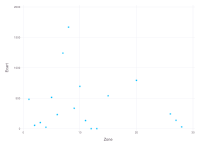

In [199]:
set_default_plot_size(20cm, 15cm)
Gadfly.plot(prediction, x=:Zone, y=:Ecart, Geom.point, Guide.ylabel("Ecart"))

On constate que les écarts les plus importants sont obtenus pour les zones 7 et 8. Cela peut en partie s'expliquer par le fait que ces zones font partie de celles avec le plus de cerfs. Il s'agit également de zones relativement éloignées de Montréal (d'où les données météo proviennent), ce qui peut également influer sur nos résultats. Néanmoins, d'autres zones mieux prédites sont tout aussi éloignées de Montréal, donc d'autres facteurs doivent être à l'œuvre.

#### Prédictions sur l'année d'intérêt - 2021

##### Estimation du nombre de permis

Pour l'année d'intérêt, nous devons nous construire une matrice de structure qui contient les variables explicatives candidates.

Le nombre de permis vendus pour l'année 2021 ne figure pas dans les données fournies. Nous allons donc devoir l'estimer. Pour cela, nous avons eu trois approches différentes, deux régressions linéaires, une d'ordre 1 et une d'ordre 2, et une autre régression linéaire avec un lissage exponentiel.

 - Régression d'ordre 1 :

In [200]:
permis_local = permis

y = permis_local.Total
n_permis = length(y)
X_permis = hcat(ones(n_permis), permis_local.Année)

β̂₀₁, β̂₁₁= X_permis'X_permis\X_permis'y

n_permis_2021_1 = β̂₀₁ + β̂₁₁ * 2021
println("# permis 2021 - ordre 1  : $n_permis_2021_1")

# permis 2021 - ordre 1  : 150581.3083003838


- Régression d'ordre 2 :

In [201]:
permis_local = permis

y = permis_local.Total
n_permis = length(y)
X_permis = hcat(ones(n_permis), permis_local.Année, permis_local.Année.^2)

β̂₀, β̂₁, β̂₂ = X_permis'X_permis\X_permis'y

n_permis_2021_2 = β̂₀ + β̂₁ * 2021 + β̂₂ * 2021^2
println("# permis 2021 - ordre 2  : $n_permis_2021_2")

# permis 2021 - ordre 2  : 125252.52939105034


 - Régression avec lissage exponentiel : Permet de prédire le nombre  de permis en favorisant les données récentes. On prédit avec un paramètre alpha de 0.25, assez faible pour que les données un peu plus anciennes ne soient pas totalement écrasées.

In [202]:
function exp_smoothing(alpha, serie_temp)   #paramètre alpha qui détermine à quel point on favorise les données récentes
    len = size(serie_temp)[1]
    pred = alpha*serie_temp[len]
    for i in 1:(len-1)
        pred+= alpha*(1-alpha)^(i)*serie_temp[len-i]
    end
    return pred
end

exp_smoothing (generic function with 1 method)

In [203]:
n_permis_2021_3 = exp_smoothing(0.25, permis.Total[1:22])
println("# permis 2021 - lissage exponentiel  : $n_permis_2021_3")

# permis 2021 - lissage exponentiel  : 146688.14294404045


Le graphe suivant montre nos trois prédictions pour l'année 2021 :

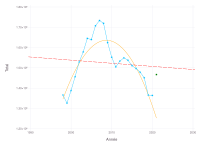

In [204]:
x_permis = range(1998, 2021, length=100)
Gadfly.plot(
    layer(permis_local, x=:Année, y=:Total, Geom.line, Geom.point, intercept = [β̂₀₁], slope = [β̂₁₁], Geom.abline(color="red", style=:dash)),
    layer(x=x_permis, y=[β̂₀ + β̂₁ * year + β̂₂ * year^2 for year in x_permis], Geom.line, Theme(default_color="orange")),
    layer(x=[2021], y=[n_permis_2021_3], Geom.point, Theme(default_color="green"))
)

On constate que les deux prédictions varient de ~25'000 permis (compris entre 125'000 et 150'000), ce qui a une importance majeure dans nos prédictions. Nous prendrons finalement la première valeur `n_permis_2021_1` estimée par la régression simple d'ordre 1. Ce choix est motivé par le fait que l'année 2020 a probablement souffert de la pandémie, ce qui aurait réduit le nombre de chasseurs pour cette année. L'année 2021 nous a semblé plus propice à un grand nombre de chasseurs, et ce même si la chasse est une discipline en berne depuis quelques années.

##### Estimation des proportions d'engins

Nous n'avons évidemment pas non plus les proportions de chaque engin pour l'année 2021 (puisqu'il nous faudrait le nombre de cerfs total). Nous avons donc implémenté une fonction qui estime la proportion de cerfs tués par un engin pour chacune des zones, en utilisant toutes les années disponibles. Nous utilisons une régression linéaire simple :

In [205]:
function estimate_proportion(engin, prop)
    prop_zones_2021 = Float64[]

    for zone in groupby(engin, :Zone)
        y = zone[!, prop]
        n = length(y)
        X_prop = hcat(ones(n), zone.Année)

        β̂₀₁, β̂₁₁= X_prop'X_prop\X_prop'y

        prop_estimation = β̂₀₁ + β̂₁₁ * 2021
        prop_estimation = max(0, prop_estimation)
        push!(prop_zones_2021, prop_estimation)
    end

    replace!(prop_zones_2021, NaN => 0)

    return prop_zones_2021
end


estimate_proportion (generic function with 1 method)

In [206]:
prop_Arbalete_2021 = estimate_proportion(select(main_df, [:Année, :Zone, :Prop_Arbalete]), "Prop_Arbalete")
prop_Carabine_2021 = estimate_proportion(select(main_df, [:Année, :Zone, :Prop_Carabine]), "Prop_Carabine")
prop_ACB_2021 = estimate_proportion(select(main_df, [:Année, :Zone, :Prop_ACB]), "Prop_ACB")
prop_Arc_2021 = estimate_proportion(select(main_df, [:Année, :Zone, :Prop_Arc]), "Prop_Arc")

18-element Vector{Float64}:
 0.001634944098761526
 0.0
 0.0
 0.0
 0.0
 0.0008834001288171578
 0.0
 0.0
 0.017823125305527654
 0.01027394992832864
 0.012516708182216174
 0.026733500417359224
 0.0
 0.018465149099510754
 0.0
 0.004921790081879429
 0.0
 0.04365066404266926

On peut maintenant se construire notre matrice de structure avec l'année 2021, puisque nous avons les données requises :

In [207]:
test = CSV.read("data/test.csv", DataFrame);
features_2021 = DataFrame(
    Zone=test.Zone,
    N_permis_total=[n_permis_2021_1 for _ in 1:size(test.Zone, 1)],
    mean_hunting_temp=[mean_stats_per_year[22,2] for _ in 1:size(test.Zone, 1)],
    total_snow_cm=[mean_stats_per_year[22,3] for _ in 1:size(test.Zone, 1)],
    total_rain_mm=[mean_stats_per_year[22,4] for _ in 1:size(test.Zone, 1)],
    Prix_moyen_essence_Montréal=[df_essence_moyenne_annee[25,2] for _ in 1:size(test.Zone, 1)],
    Année=[2021 for _ in 1:size(test.Zone, 1)],
    Prop_Arbalete=prop_Arbalete_2021,
    Prop_Carabine=prop_Carabine_2021,
    Prop_ACB=prop_ACB_2021,
    Prop_Arc=prop_Arc_2021
)

show(features_2021, allcols=true)

18×11 DataFrame
 Row │ Zone   N_permis_total  mean_hunting_temp  total_snow_cm  total_rain_mm  Prix_moyen_essence_Montréal  Année  Prop_Arbalete  Prop_Carabine  Prop_ACB     Prop_Arc   
     │ Int64  Float64         Float64            Float64        Float64        Float64                      Int64  Float64        Float64        Float64      Float64    
─────┼───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │     1       1.50581e5            10.5341      0.0417582        2.66374                      149.933   2021     0.19566        0.797375    0.00187791   0.00163494
   2 │     2       1.50581e5            10.5341      0.0417582        2.66374                      149.933   2021     0.12135        0.884926    0.000497187  0.0
   3 │     3       1.50581e5            10.5341      0.0417582        2.66374                      149.933   2021     0.234634       0.672136  

À noter ci-dessus que nous avons mis les proportions d'engins dans notre matrice de structure pour l'année 2021, comme c'est l'une des pistes que nous avons exploré, sans succès. Nous en parlerons plus en détail dans la conclusion ci-dessous.

On entraîne enfin notre modèle :

In [208]:
# using all data including 2020
train = copy(main_df)

variables = [
    "Année",
    "N_permis_total"
]

df_models_best_R2 = run(variables, train)
show(df_models_best_R2, allcols=true)

Le R² moyen pour toutes les zones : 0.3894201258970745
18×4 DataFrame
 Row │ Zone   Variable                     R²         Parameters    
     │ Int64  Array…                       Float64    DataFrame     
─────┼──────────────────────────────────────────────────────────────
   1 │     1  ["Année", "N_permis_total"]  0.365472   1×3 DataFrame 
   2 │     2  ["Année", "N_permis_total"]  0.350458   1×3 DataFrame 
   3 │     3  ["N_permis_total"]           0.0659091  1×2 DataFrame 
   4 │     4  ["Année"]                    0.174042   1×2 DataFrame 
   5 │     5  ["N_permis_total"]           0.0553913  1×2 DataFrame 
   6 │     6  ["Année"]                    0.19584    1×2 DataFrame 
   7 │     7  ["Année", "N_permis_total"]  0.47404    1×3 DataFrame 
   8 │     8  ["Année"]                    0.200356   1×2 DataFrame 
  ⋮  │   ⋮                 ⋮                   ⋮            ⋮
  12 │    12  ["N_permis_total"]           0.309023   1×2 DataFrame 
  13 │    13  ["Année", "N_permis_total"

On peut vérifier la colinéarité pour s'assurer que notre modèle est stable :

In [209]:
scan_colinearity_vif(train, df_models_best_R2)

No multicolineraty detected for zone 1
No multicolineraty detected for zone 2
No multicolineraty detected for zone 3
No multicolineraty detected for zone 4
No multicolineraty detected for zone 5
No multicolineraty detected for zone 6
No multicolineraty detected for zone 7
No multicolineraty detected for zone 8
No multicolineraty detected for zone 9
No multicolineraty detected for zone 10
No multicolineraty detected for zone 11
No multicolineraty detected for zone 12
No multicolineraty detected for zone 13
No multicolineraty detected for zone 15
No multicolineraty detected for zone 20
No multicolineraty detected for zone 26
No multicolineraty detected for zone 27
2×3 DataFrame
 Row │ Variable        Zone   VIF     
     │ String          Int64  Float64 
─────┼────────────────────────────────
   1 │ Année              28  16.3571
   2 │ N_permis_total     28  16.3571
^ Multicolineraty detected for the above zone/variables ^



Comme c'était le cas pour notre modèle d'entraînement, on observe encore une fois une multicolinéarité entre l'année et le nombre de permis vendus pour la zone 28, comme nous avons très peu de données pour cette zone.

Et nous pouvons enfin passer aux prédictions :

In [210]:
ŷ = Int64[]

for i in 1:size(test,1)
    zone_i = test.Zone[i]
    parameters_i = Matrix(df_models_best_R2.Parameters[i])
    validate_i = Matrix(select(filter(:Zone => z -> z == zone_i, features_2021), df_models_best_R2.Variable[i]))
    prediction_i = Int64(ceil(sum(hcat(1, validate_i) * parameters_i')))
    push!(ŷ, prediction_i)
end

ŷ = max.(0,ŷ)

println("Predictions for year 2021 : $ŷ")

Predictions for year 2021 : [1232, 582, 1780, 3065, 1846, 4069, 3600, 3213, 906, 3389, 842, 14, 12, 102, 2792, 157, 991, 415]


In [211]:
prediction = DataFrame(Zone = test.Zone, Cerfs = ŷ)
CSV.write("benchmark_predictions.csv", prediction)

"benchmark_predictions.csv"

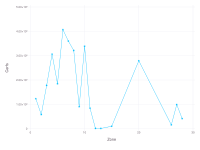

In [212]:
set_default_plot_size(20cm, 15cm)
Gadfly.plot(prediction, x=:Zone, y=:Cerfs, Geom.line, Geom.point, Guide.ylabel("Cerfs"))

Notre meilleur score obtenu sur Kaggle est 615.14898.

## Conclusion et améliorations

#### Pistes avortées
Nous avons longtemps essayé de tirer de l'information des engins. Nous pensions que d'ajouter les proportions de cerfs récoltés par les différents engins comme variables explicatives pourrait nous aider à faire de meilleures prédictions. Cela s'illustre par le fait que notre `main_df` ainsi que les features utilisées pour l'année 2021 comprennent toute cette information. Malheureusement, ces variables explicatives souffraient trop de la multicolinéarité, c'est pourquoi le modèle présenté ci-dessus ne prend pas en compte ces proportions.

Nous avons aussi tenté d'utiliser les données météo de l'hiver précédant la saison de la chasse, plutôt que celles de la saison elle-même. Nous pensions que moins de cerfs seraient présents lors de la chasse si l'hiver avait été rude. Là non plus, nous n'avons pas obtenu de résultats probants. Il s'est avéré que les chasseurs sont plus sensibles à la météo que les cerfs, l'utilisation des données météo durant la saison de la chasse donnait donc de meilleurs résultats selon notre approche.


#### Conclusion 

Nous avons choisi une approche simple : une régression linéaire qui utilise la meilleure combinaison possible de variables explicatives en les évaluant de manière exhaustive selon le $R^2_{aj}$. L'exploration des données nous aura permis de découvrir que la météo et le nombre de permis semblaient avoir un impact sur la quantité à prédire. Nous avons ensuite préparé notre DataFrame principal en gérant les valeurs manquantes. Nous avons appliqué notre méthodologie sur un ensemble d'entraînement et de validation afin de nous donner une idée de la performance du modèle. Enfin, nous avons appliqué le meilleur modèle trouvé à date pour prédire les quantités de cerfs récoltés pour l'année 2021.

#### Améliorations

Les résultats ne sont pas au rendez-vous. Nous avons identifié les pistes d'amélioration suivantes :
 - Nous aurions du prêter tout particulièrement attention au nombre de permis, qui est manquant pour l'année 2021, et dont l'estimation influe donc énormément sur nos prédictions. Nous avions pourtant exploré trois méthodes pour l'estimer, mais il semble que cela ne suffise pas. Il est possible qu'en ajustant mieux le modèle de régression d'ordre 1 avec l'*exponential smoothing* (le paramètre $\alpha$), cela aurait donné de meilleurs résultats.
 - L'utilisation de la carte des zones pour ajouter de la connaissance est également une piste à explorer : par exemple, pondérer certaines variables explicatives selon leur localisation (météo, essence) afin de prendre en compte la grande distance entre les zones et Montréal, d'où proviennent les données météo pour toutes les zones. Même raisonnement pour le prix de l'essence.
 - Utiliser une PCA sur notre matrice d'entraînement ou une régression ridge afin de contourner les problèmes de colinéarité que nous avons rencontré avec la zone 28 par exemple. Lorsque nous avons exploré les modèles prenant en compte les proportions d'engins, nous souffrions beaucoup de ce problème et cette méthode aurait pu nous aider.
 - Nos prédictions sont mauvaises pour des zones à forte densité de cerfs : ces zones ruinent notre MSE lors des soumissions. Une étude plus approfondie de ces zones particulières (1, 3, 5 et 6), par exemple un modèle spécifique à chacune d'elles, aurait été indiquée.